# JWST Rogue Path Tool Example with Program 

## Imports

In [1]:
import numpy as np
import pathlib

from jwst_rogue_path_tool.apt_sql_parser import aptSqlFile
from jwst_rogue_path_tool.detect_claws import aptProgram
from jwst_rogue_path_tool.constants import PROJECT_DIRNAME

HOMEDIR = pathlib.Path.home()

**WARNING**: LOCAL JWST PRD VERSION PRDOPSSOC-065 DOESN'T MATCH THE CURRENT ONLINE VERSION PRDOPSSOC-067
Please consider updating pysiaf, e.g. pip install --upgrade pysiaf or conda update pysiaf


## Working with APT SQL Files
Below we will show how to inspect APT SQL files using AptSqlFile

In [2]:
aptSqlFile?

Init signature: aptSqlFile(sqlfile)
Docstring:      Read and parse SQL file generated from APT
Init docstring:
Parameters
----------
sqlfile : str
    Name of APT SQL file (filename.sql)
File:           ~/Desktop/sandbox/jwst_rogue_path_tool/jwst_rogue_path_tool/apt_sql_parser.py
Type:           type
Subclasses:     

### Opening APT SQL File and Displaying Table Names

In [3]:
apt_sql_filename = pathlib.Path(PROJECT_DIRNAME) / "data" / "APT_test_4RPtool.sql"

# Parse the APT SQL file to obtain useful information for Claw Tool
parsed_apt_sql = aptSqlFile(apt_sql_filename)

parsed_apt_sql.tablenames

['apt_diagnostics',
 'association_candidates',
 'exposures',
 'fixed_target',
 'instruments',
 'link',
 'miri_exposure_specification',
 'miri_templates',
 'mosaic',
 'nircam_exposure_specification',
 'nircam_imaging_dither',
 'nircam_templates',
 'niriss_dither',
 'niriss_exposure_specification',
 'niriss_target_acq',
 'niriss_templates',
 'observation',
 'observation_association_candidates',
 'program',
 'special_requirements',
 'target',
 'target_description',
 'visit',
 'visit_linkspec',
 'visit_overheads',
 'visit_targets',
 'visit_track']

### Selecting Table and Displaying Contents

In [4]:
tablename = "exposures"
parsed_apt_sql.get_aptsql_metadata(tablename)  # This is a list of dictionaries

[{'AperName': 'NRCALL_FULL',
  'apt_label': 'BASE',
  'dark_parallel_slot_duration': '0',
  'dither_point_index': '0',
  'exposure': '0',
  'exposure_spec_order_number': '0',
  'external_parallel_slot_duration': '0',
  'ideal_x_position': '-58.00017994895969',
  'ideal_y_position': '-23.499979688907533',
  'max_data_rate': '2.3005486156451145',
  'mosaic_tile_order_number': '0',
  'observation': '1',
  'oss_AperName': 'NRCA5_FULL_OSS',
  'oss_ideal_x_position': '-29.82882610895535',
  'oss_ideal_y_position': '-22.814783209824732',
  'pointing_sequence_number': '0',
  'pointing_type': 'BASE',
  'program': '0',
  'target_id': '1',
  'target_order_number': '0',
  'v2': '56.1322505835887',
  'v3': '-516.3539981620261',
  'visit': '1'},
 {'AperName': 'NRCALL_FULL',
  'apt_label': 'SCIENCE',
  'dark_parallel_slot_duration': '751',
  'data_volume_mib': '560.0',
  'dec_center_rotation': '19.237768017510067',
  'dither_point_index': '1',
  'exposure': '1',
  'exposure_duration': '381',
  'expos

### Creating DataFrame of Table Contents

In section 2.1 we displayed the contents of a table as a list of dictionaries. Here we make use of the `build_aptsql_dataframe` to create a DataFrame to make the contents more legible and gives us access to all of the useful `pandas` methods and attributes

In [5]:
exposures_df = parsed_apt_sql.build_aptsql_dataframe(tablename)
exposures_df  # this is a dataframe

,AperName,apt_label,dark_parallel_slot_duration,dither_point_index,exposure,exposure_spec_order_number,external_parallel_slot_duration,ideal_x_position,ideal_y_position,max_data_rate,...,implicit_exposure,number_of_detector_outputs,number_of_groups,number_of_integrations,number_of_scas,photon_collecting_duration,ra_center_rotation,readout_pattern,region_shape,visit_file_sequence
0,NRCALL_FULL,BASE,0,0,0,0,0,-5.800018e+01,-2.349998e+01,2.300549,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NRCALL_FULL,SCIENCE,751,1,1,1,340,-5.800018e+01,-2.349998e+01,2.300549,...,N,4.0,6.0,1.0,10.0,311.366,124.083819,SHALLOW4,POLYGON ICRS 124.12941568451055 19.21929968597...,NaN
2,NRCALL_FULL,SCIENCE,0,2,2,1,340,-5.777398e+01,-2.333408e+01,2.300549,...,N,4.0,6.0,1.0,10.0,311.366,124.083886,SHALLOW4,POLYGON ICRS 124.1294822792426 19.219253670604...,NaN
3,NRCALL_FULL,BASE,0,0,0,0,0,-1.968922e-14,1.563193e-11,2.300549,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NRCALL_FULL,SCIENCE,751,3,1,1,340,-1.968922e-14,1.563193e-11,2.300549,...,N,4.0,6.0,1.0,10.0,311.366,124.100892,SHALLOW4,POLYGON ICRS 124.14648452870583 19.21278854324...,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,MIRIM_ILLUM,SCIENCE,0,2,2,4,0,-1.789144e+02,-3.109404e+02,0.852830,...,N,NaN,5.0,1.0,1.0,13.875,124.05613,FASTR1,POLYGON ICRS 124.06556672528511 19.30505771251...,2.0
207,NIS_CEN,SCIENCE,0,3,3,4,0,9.667355e+00,6.304002e-01,0.250913,...,N,4.0,10.0,1.0,1.0,429.471,124.103734,NIS,POLYGON ICRS 124.12321632568322 19.21227397792...,1.0
208,MIRIM_ILLUM,SCIENCE,0,3,3,4,0,-1.792926e+02,-3.095548e+02,0.852830,...,N,NaN,5.0,1.0,1.0,13.875,124.055985,FASTR1,POLYGON ICRS 124.06542151480403 19.30468300919...,2.0
209,NIS_CEN,DIRECT_IMAGE,0,1,1,5,0,9.667355e+00,6.304002e-01,0.235386,...,N,4.0,4.0,1.0,1.0,171.788,124.103734,NIS,POLYGON ICRS 124.12321632568322 19.21227397792...,1.0


## Creating a Program object with the JWST Rogue Path Tool with AptProgram Class

The examples below showcase the difference use cases for the JWST Rogue Path Tool.

In [6]:
aptProgram?

Init signature:
aptProgram(
    sqlfile,
    angular_step=1.0,
    usr_defined_obs=None,
    usr_defined_angles=None,
    bkg_params=[{'threshold': 0.1, 'function': <function min at 0x107dd9ef0>}, {'threshold': 0.2, 'function': <function median at 0x107f0b730>}],
)
Docstring:     
Class that handles the APT-program-level information.
aptProgram takes the sqlfile input and uses the "observations" and "exposureFrame"
objects to organize data into python objects that can be used for various analyses.
Init docstring:
Parameters
----------
sqlfile : str
    Path to an APT-exported sql file

angular_step : float
    Attitude angle step size used to check if surrounding targets land
    in susceptibility region (default: 1.0)

usr_defined_obs : list
    List of specific oberservations to load from program

usr_defined_angles : list
    List of angles to valid, only the angle values in this list will be
    evaluated
bkg_params : dictionary
    Dictionary of background threshold values and fun

### Cycle through all angles of attitude for a single observation of a program.

The example below is taking the our APT SQL and stepping through each angle of attitude in one degree steps.

In [7]:
program = aptProgram(apt_sql_filename, angular_step=1.0)

In [8]:
program.run()

Sweeping angles 0.0 --> 359.0 for Observation: 1 and Exposure: 1


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 38.58it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 1 and Exposure: 2


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 37.99it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 1 and Exposure: 4


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 39.71it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 1 and Exposure: 5


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 39.68it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 1 and Exposure: 7


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 39.03it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 1 and Exposure: 8


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 39.87it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 2 and Exposure: 10


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 38.79it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 2 and Exposure: 11


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:08<00:00, 40.07it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 2 and Exposure: 12


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 38.92it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 2 and Exposure: 13


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 39.56it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 3 and Exposure: 23


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 39.49it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 3 and Exposure: 24


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 39.68it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 3 and Exposure: 25


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 39.53it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 3 and Exposure: 26


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:08<00:00, 40.01it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 3 and Exposure: 27


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 39.35it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 3 and Exposure: 28


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 38.23it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 4 and Exposure: 89


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 39.64it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 4 and Exposure: 90


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 38.72it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 4 and Exposure: 92


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 38.95it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 4 and Exposure: 93


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 39.23it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 4 and Exposure: 95


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 38.99it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 4 and Exposure: 96


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:09<00:00, 39.13it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 5 and Exposure: 125


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:06<00:00, 59.05it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 5 and Exposure: 126


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:06<00:00, 59.73it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 5 and Exposure: 127


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:06<00:00, 58.31it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 5 and Exposure: 128


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:06<00:00, 55.20it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 6 and Exposure: 134


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:06<00:00, 53.14it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 6 and Exposure: 136


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:06<00:00, 55.64it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 6 and Exposure: 138


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:06<00:00, 59.08it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 6 and Exposure: 140


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:05<00:00, 61.83it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 6 and Exposure: 142


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:05<00:00, 62.20it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 6 and Exposure: 144


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:05<00:00, 60.40it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 7 and Exposure: 147


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:05<00:00, 61.36it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 7 and Exposure: 149


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:06<00:00, 59.50it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 8 and Exposure: 169


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:05<00:00, 61.22it/s]


Sweeping angles 0.0 --> 359.0 for Observation: 8 and Exposure: 171


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:05<00:00, 60.08it/s]


... Averaging intensities per angle ...
... Calculating flux values ...
... Calculating backgrounds and thresholds ...


In [9]:
program.observations.data  # Show ALL observation data

defaultdict(dict,
            {1: {'visit':         apt_prd_name apt_version  charged_duration  data_volume  \
              0  PRDAPTSOC-063-001    2023.7.1              1641  1255.098902   
              1  PRDAPTSOC-063-001    2023.7.1              1743  1255.098902   
              2  PRDAPTSOC-063-001    2023.7.1              1693  1255.098902   
              
                defer_orient_selection  guide_star_acquisition_duration  \
              0                      N                               89   
              1                      N                               89   
              2                      N                               89   
              
                 initial_overhead_duration internal_target  max_data_rate mosaic  ...  \
              0                        107               N       2.300549      N  ...   
              1                        107               N       2.300549      N  ...   
              2                        107       

In [10]:
program.observations.supported_observations  # Only show the supported observations for JWST Rogue Path Tool
program.observations.supported_observations.keys()  # Observation numbers to select data on.

dict_keys([1, 2, 3, 4, 5, 6, 7, 8])

In [11]:
# Select a single observation of interest
observation = program.observations.data[1]
observation['exposure_frames'].data
# show pandas df for single exposure frame

{1:       AperName apt_label  dark_parallel_slot_duration  dither_point_index  \
 0  NRCALL_FULL   SCIENCE                          751                   1   
 1  NRCALL_FULL   SCIENCE                          751                   1   
 2  NRCALL_FULL   SCIENCE                          751                   1   
 
    exposure  exposure_spec_order_number  external_parallel_slot_duration  \
 0         1                           1                              340   
 1         1                           1                              340   
 2         1                           1                              340   
 
    ideal_x_position  ideal_y_position  max_data_rate  ...  number_of_groups_y  \
 0         -58.00018         -23.49998       2.300549  ...                   6   
 1         -58.00018         -23.49998       2.300549  ...                   6   
 2         -58.00018         -23.49998       2.300549  ...                   6   
 
    number_of_integrations_y observation_y 

#### Show Valid Angle Ranges per Expsoure

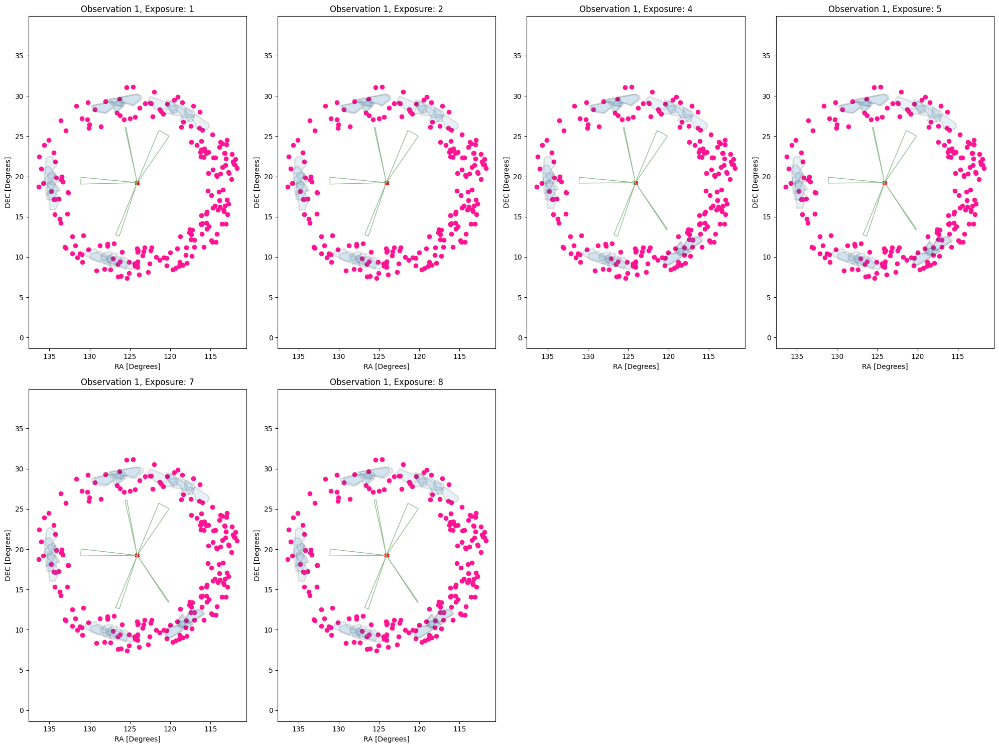

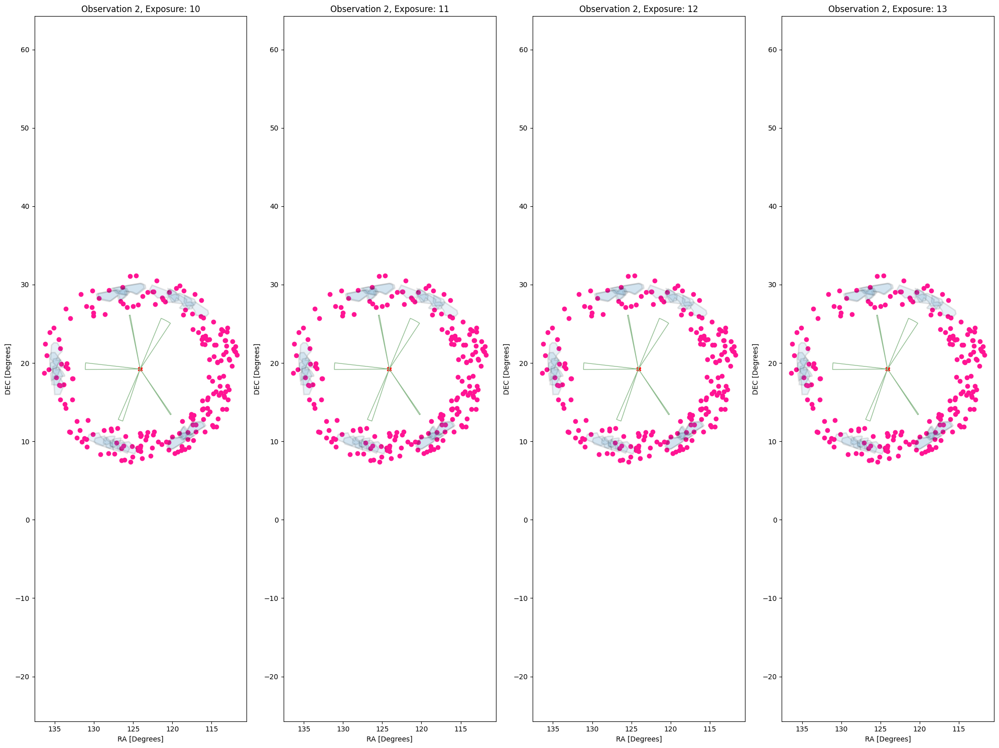

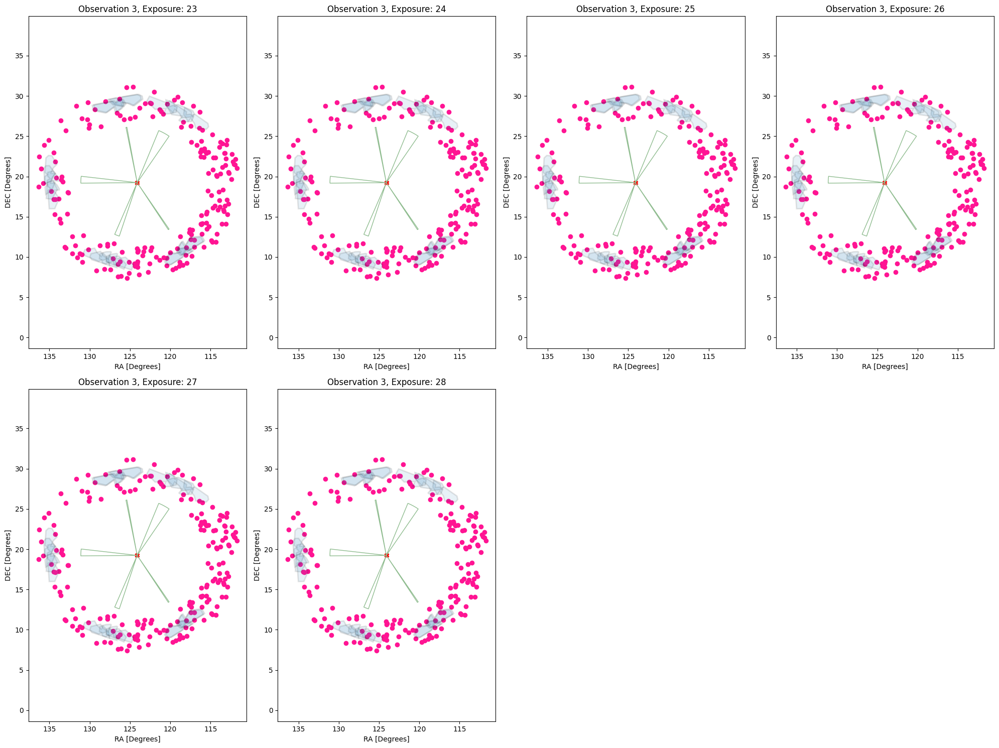

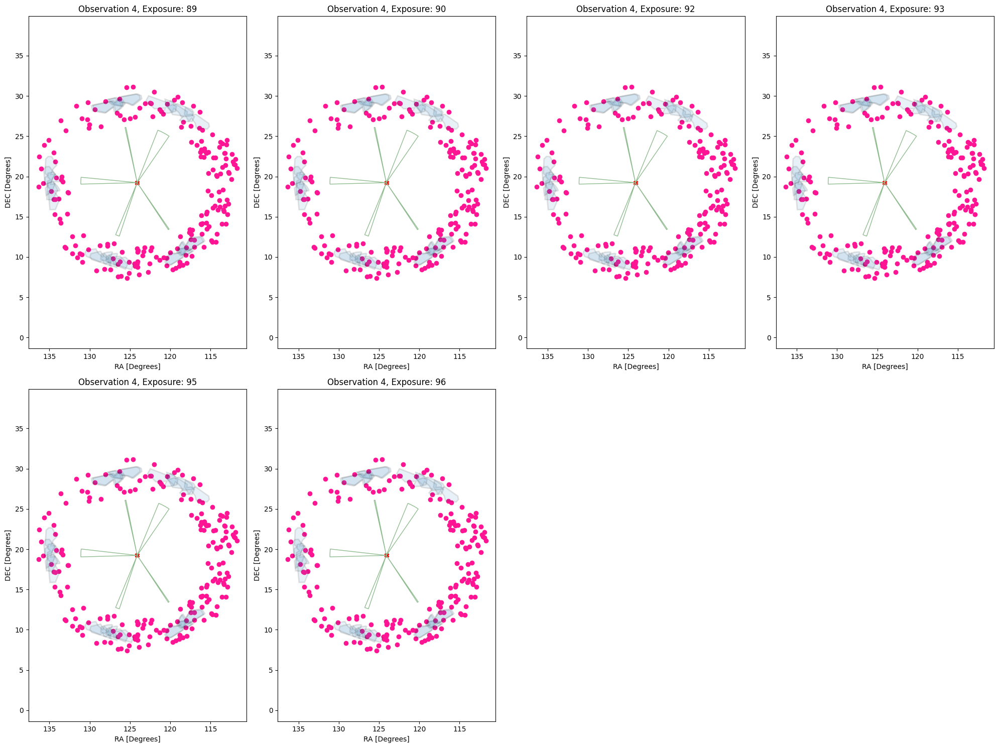

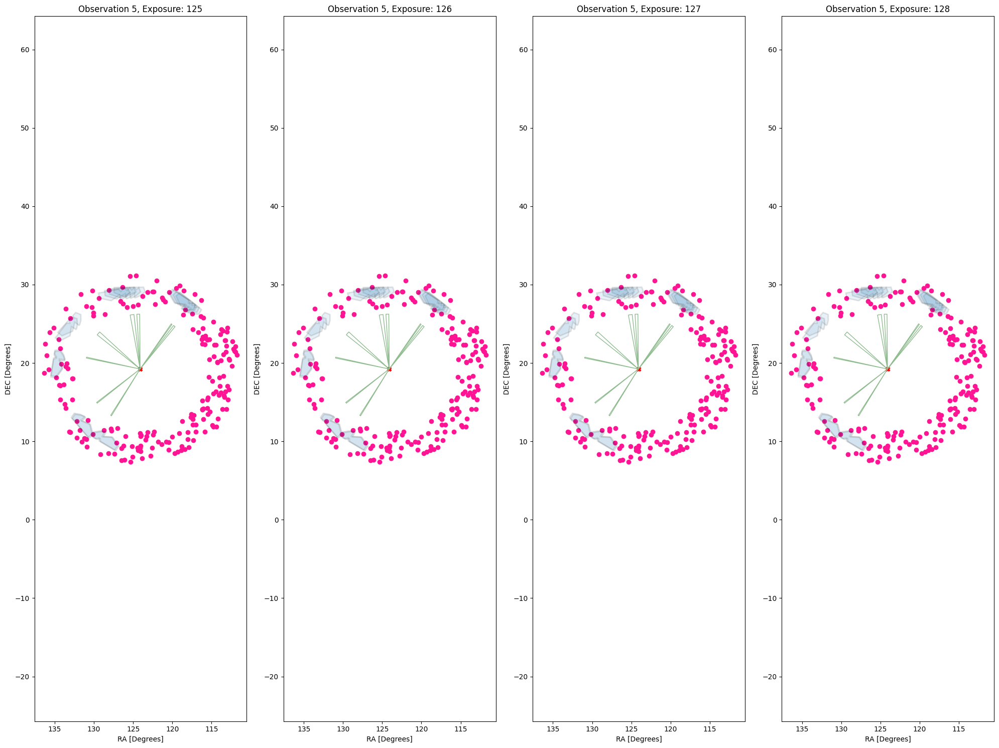

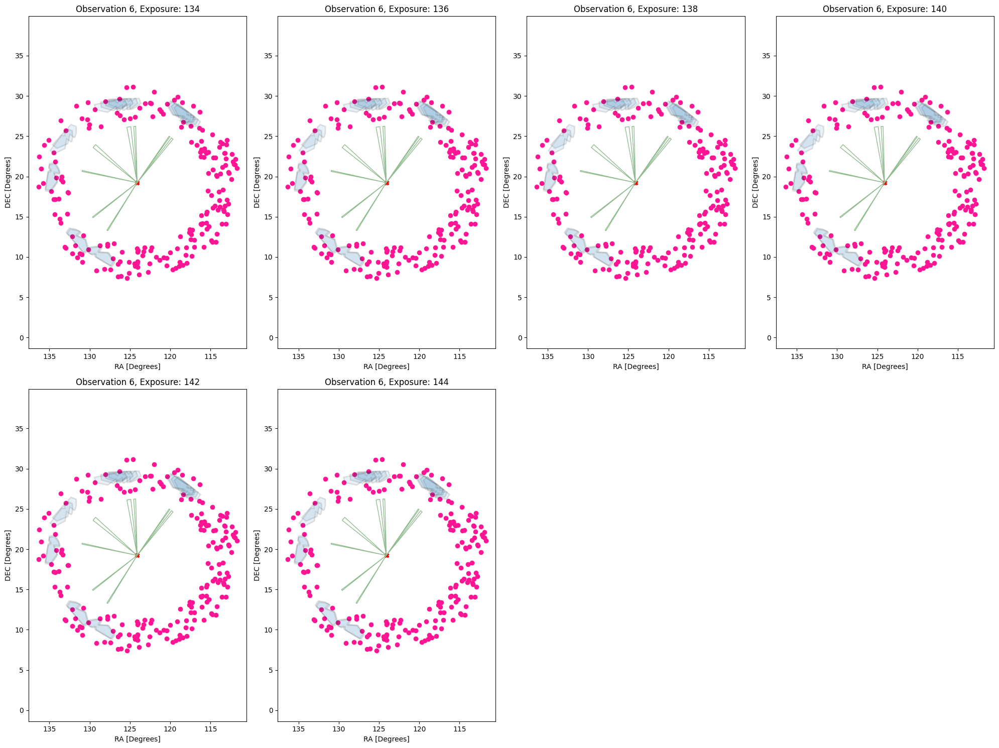

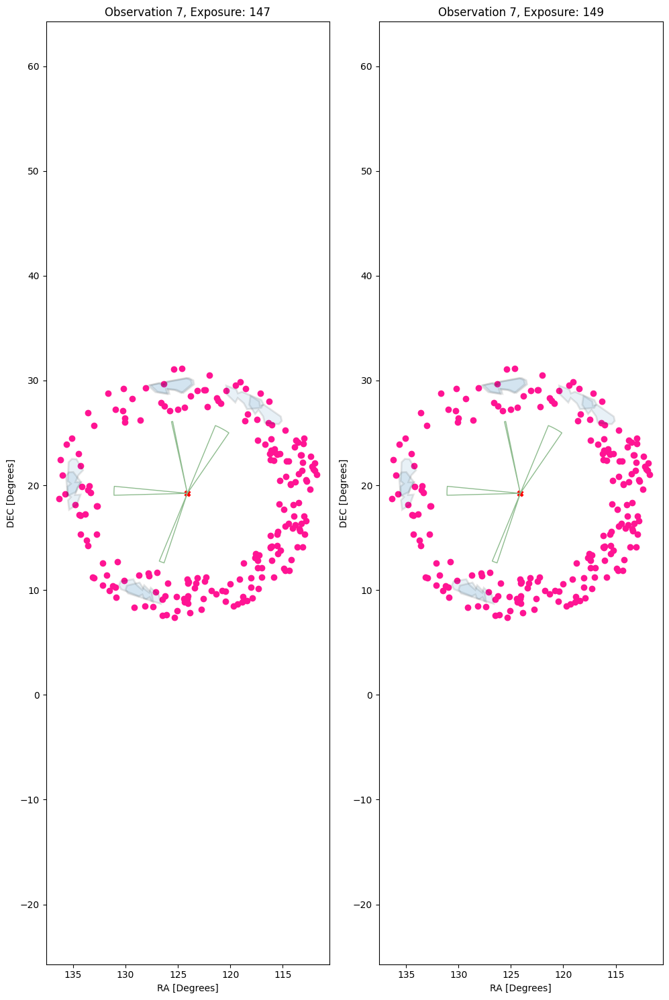

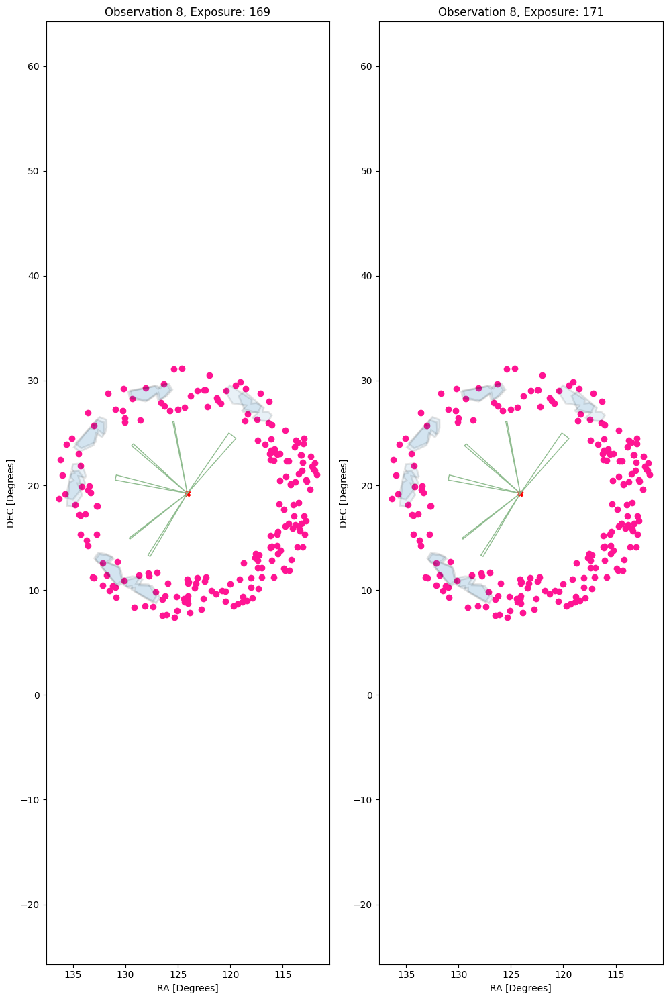

In [12]:
supported_observations = program.observations.supported_observations.keys()
for obs_number in supported_observations:
    program.plot_exposures(program.observations.data[obs_number])

#### Show Valid Angles Ranges at Observation Level

This will show valid angle ranges across all exposures in a single observation. If angles ranges are valid in one exposure but not in others, it will not be shown at this level.

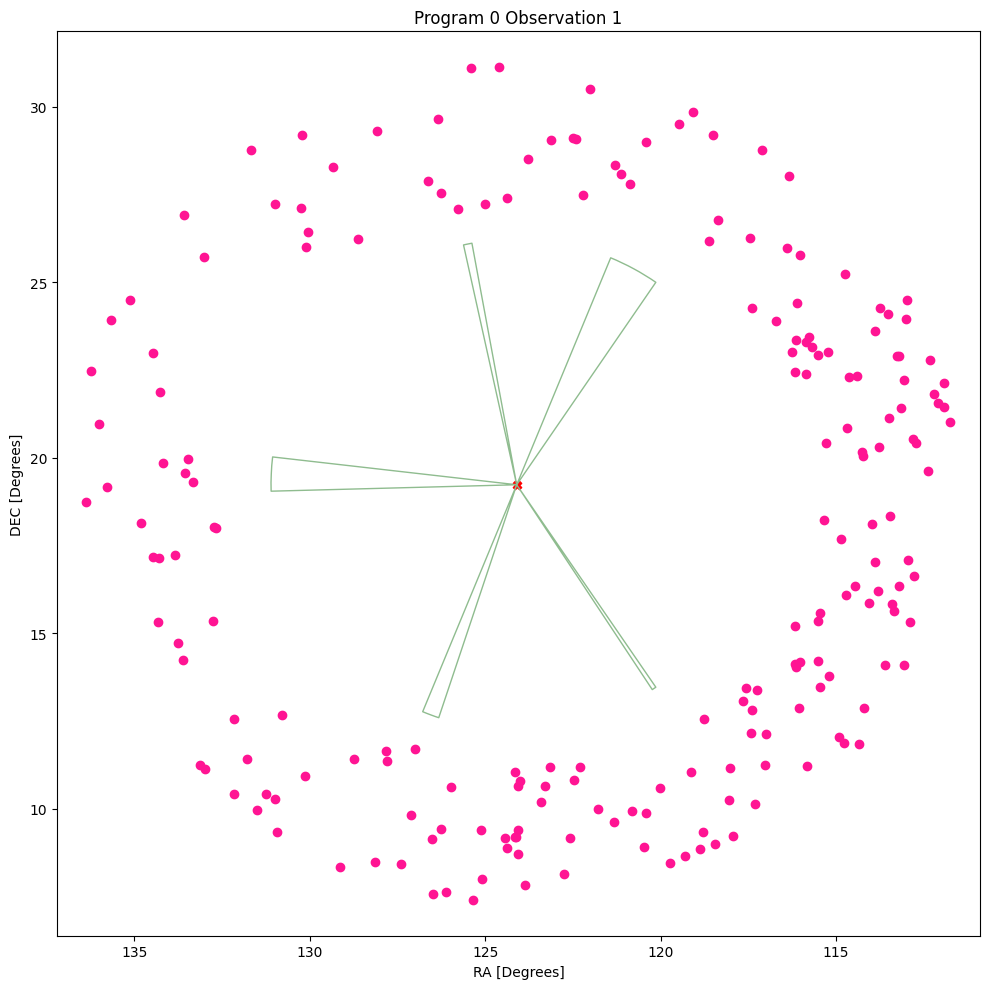

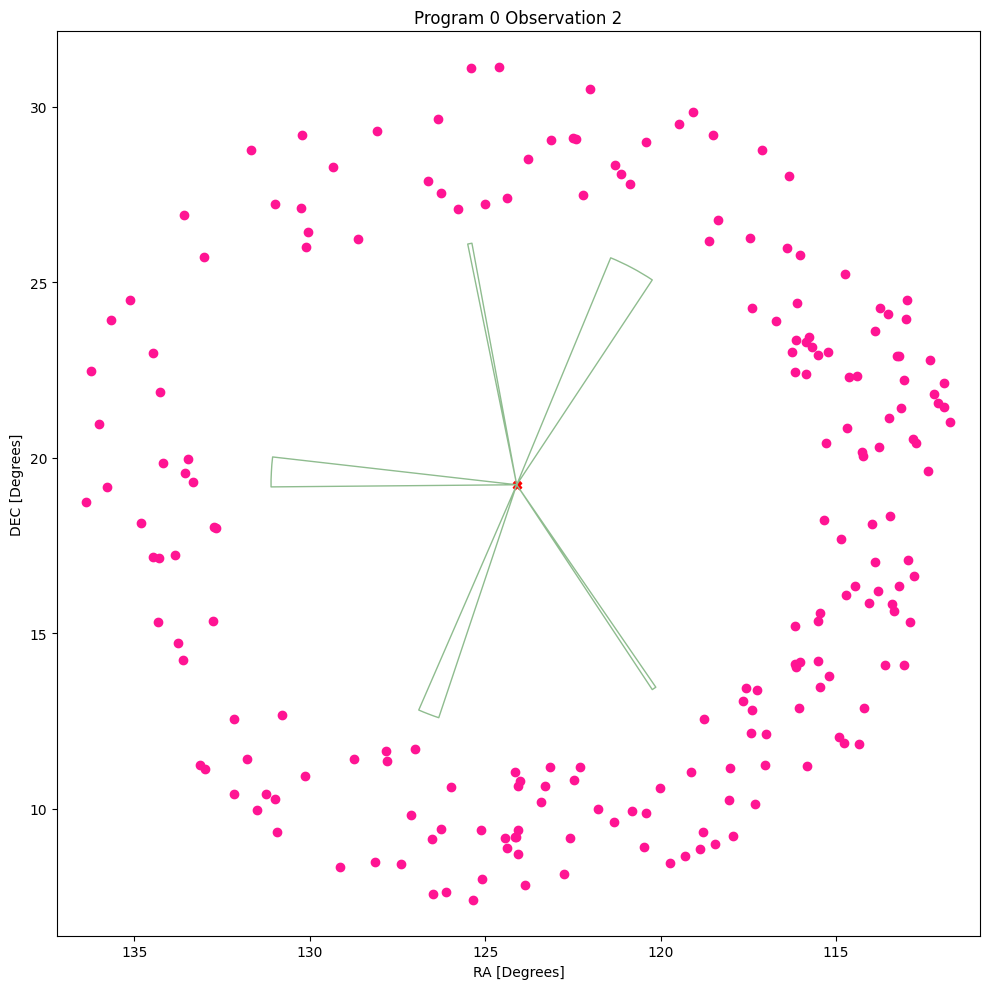

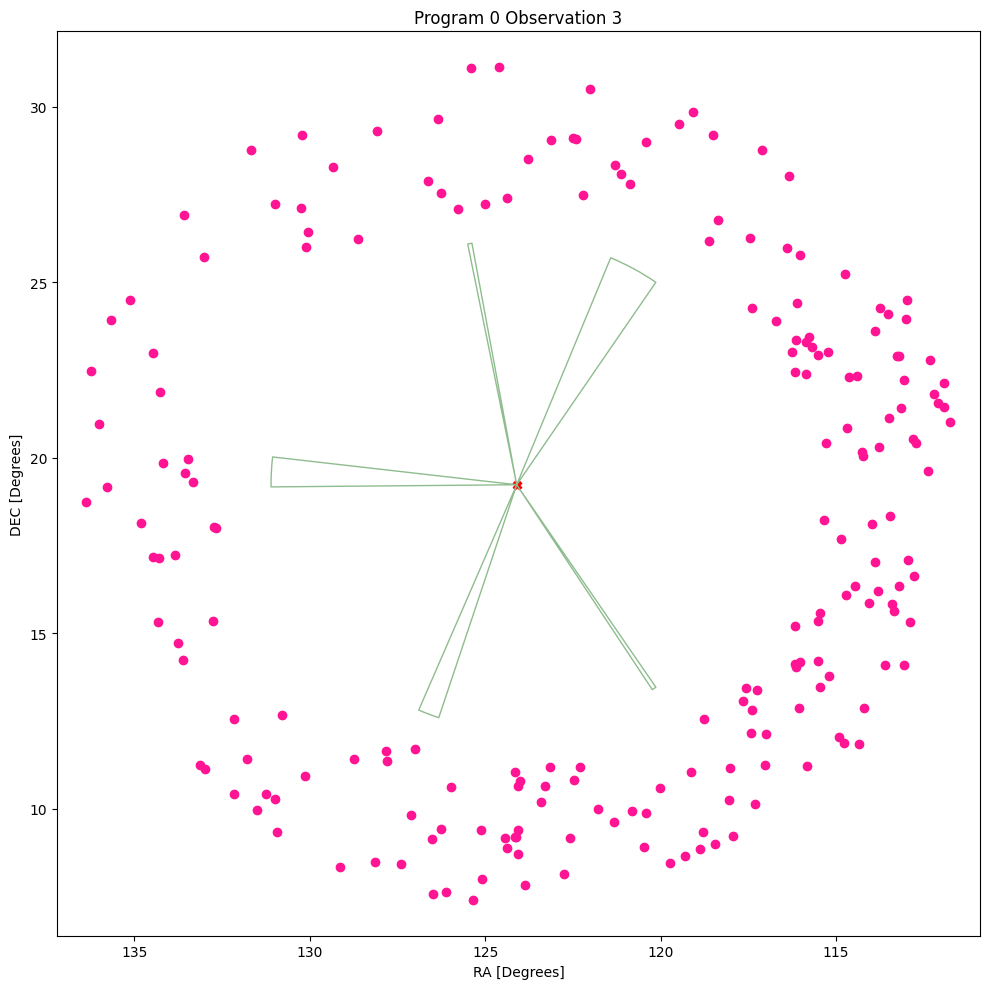

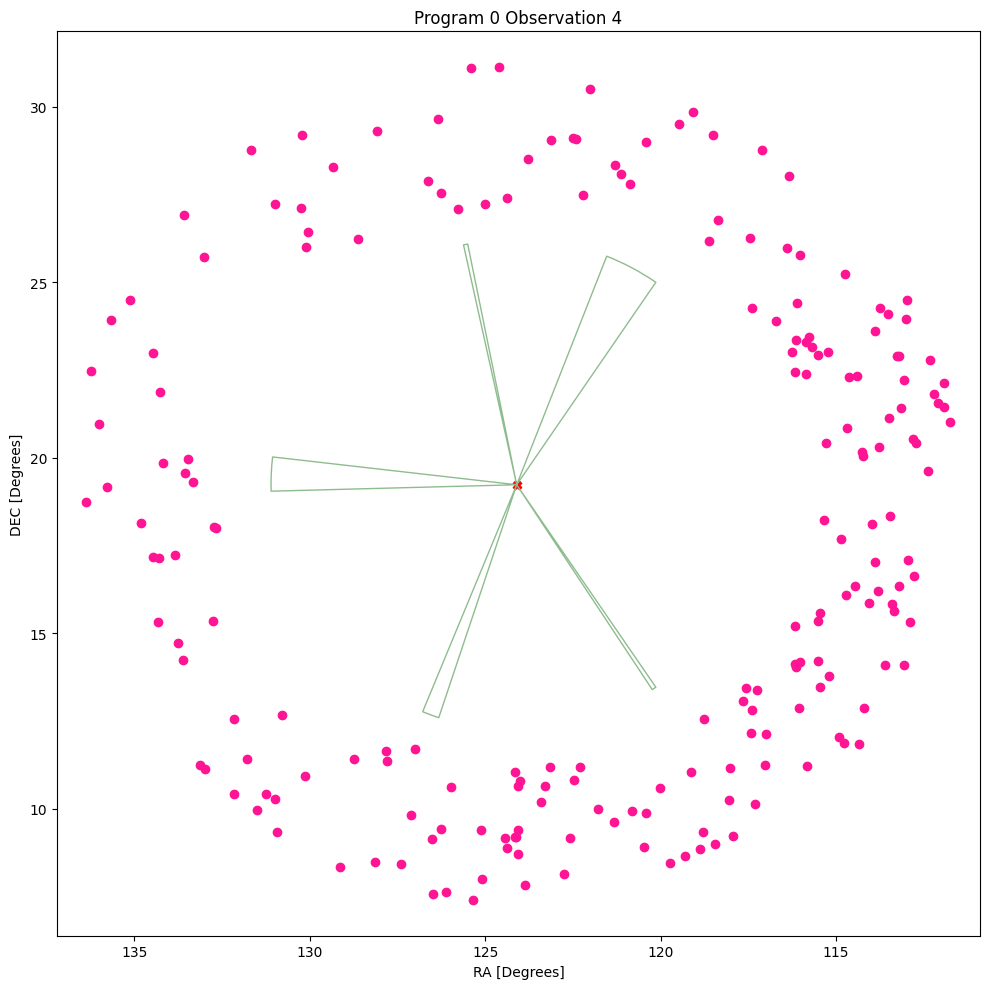

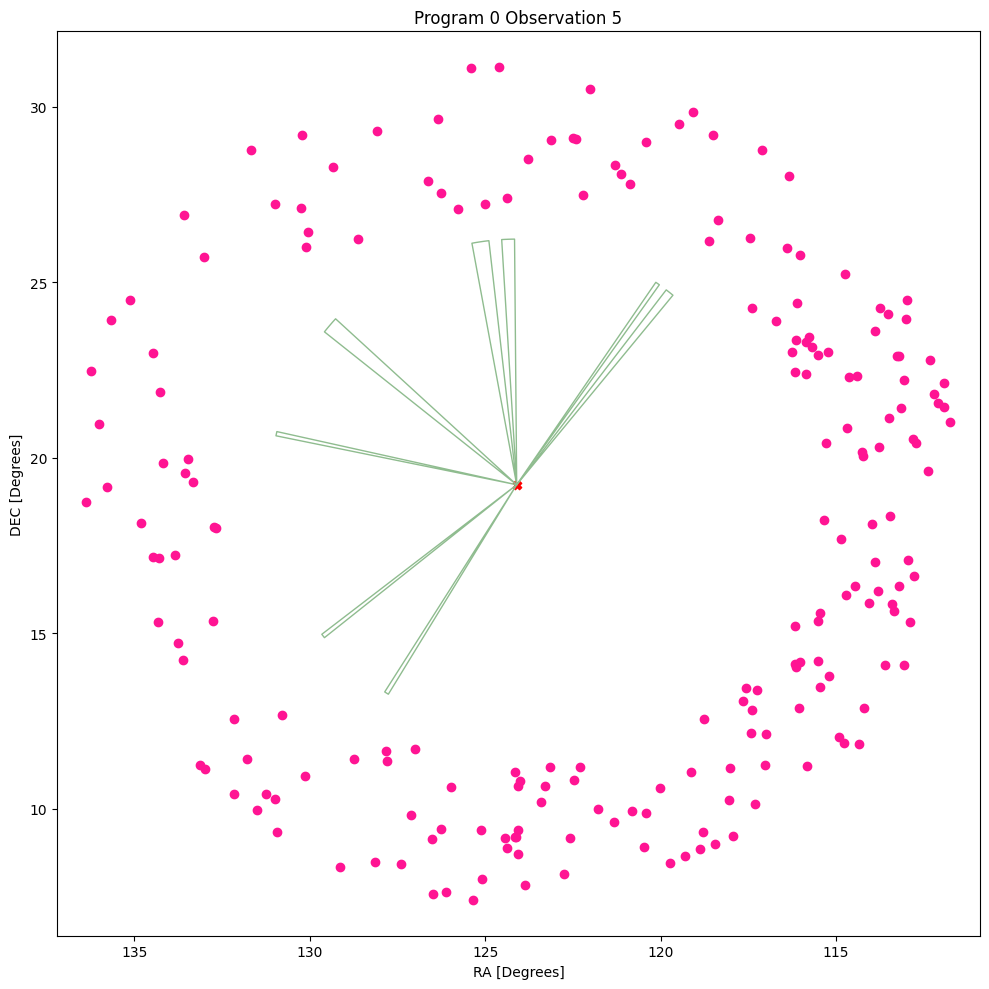

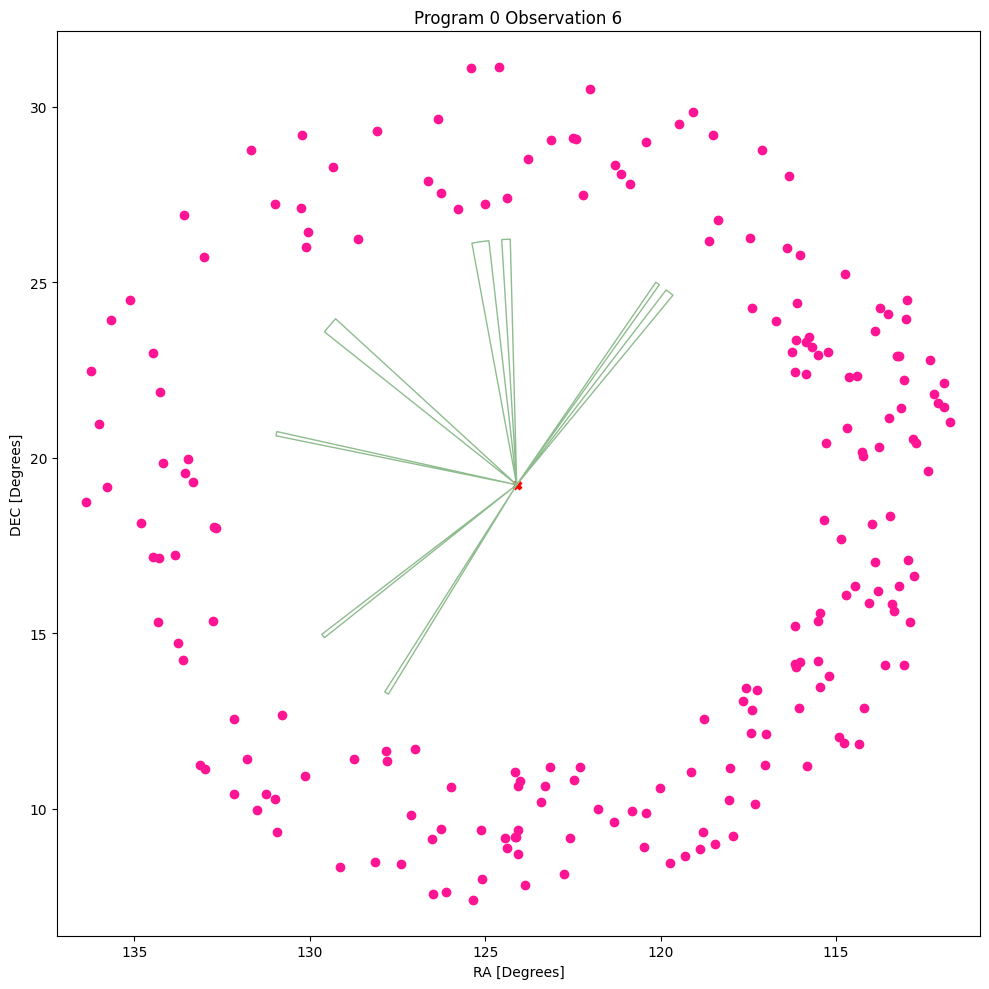

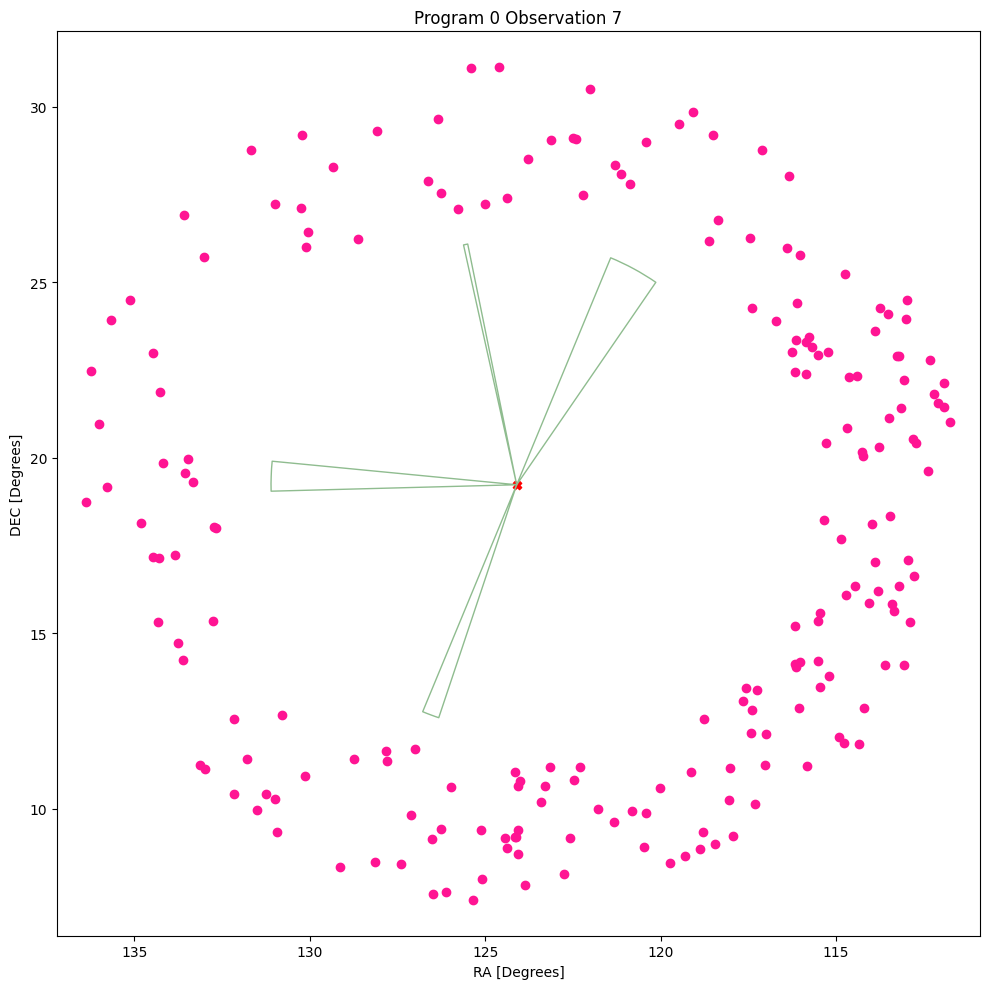

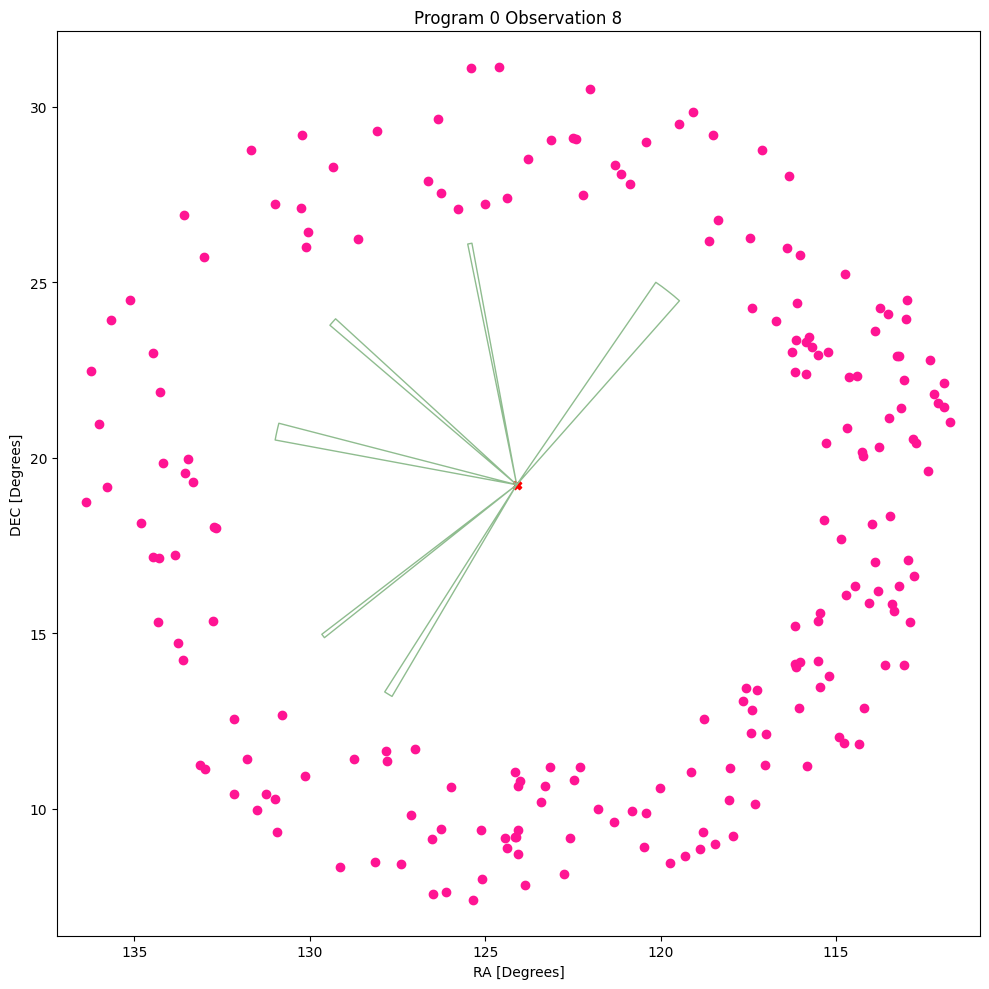

In [13]:
supported_observations = program.observations.supported_observations.keys()
for obs_number in supported_observations:
    program.plot_observation(program.observations.data[obs_number])

### Plotting a Single Angle of Attitude in V2 & V3 Space

The figure below shows what the tool is searching for when sweeping angles. Here for a single angle we show the V2 & V3 space of the targets in our source catalog as well as the susceptibility region. The intensity of targets that fall in this region are dependent on the location where of the target in the susceptibility region and the brightness of the target.

<Figure size 1000x1000 with 0 Axes>

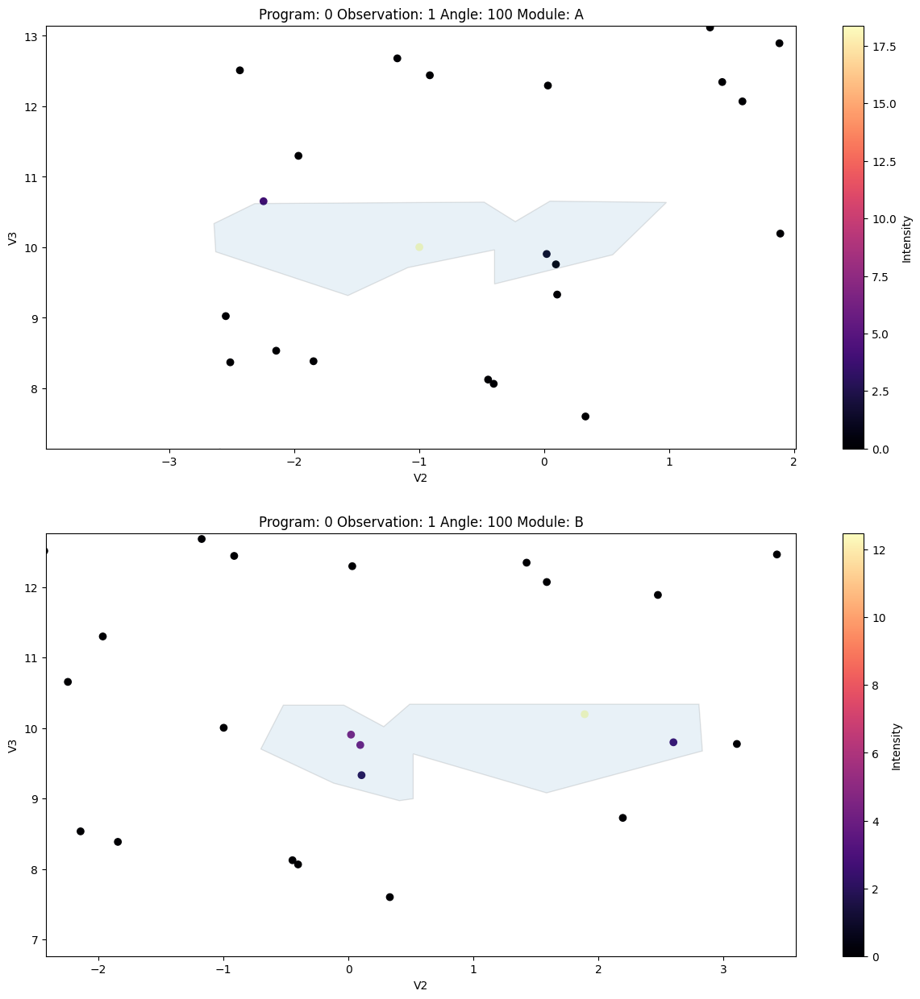

<Figure size 1000x1000 with 0 Axes>

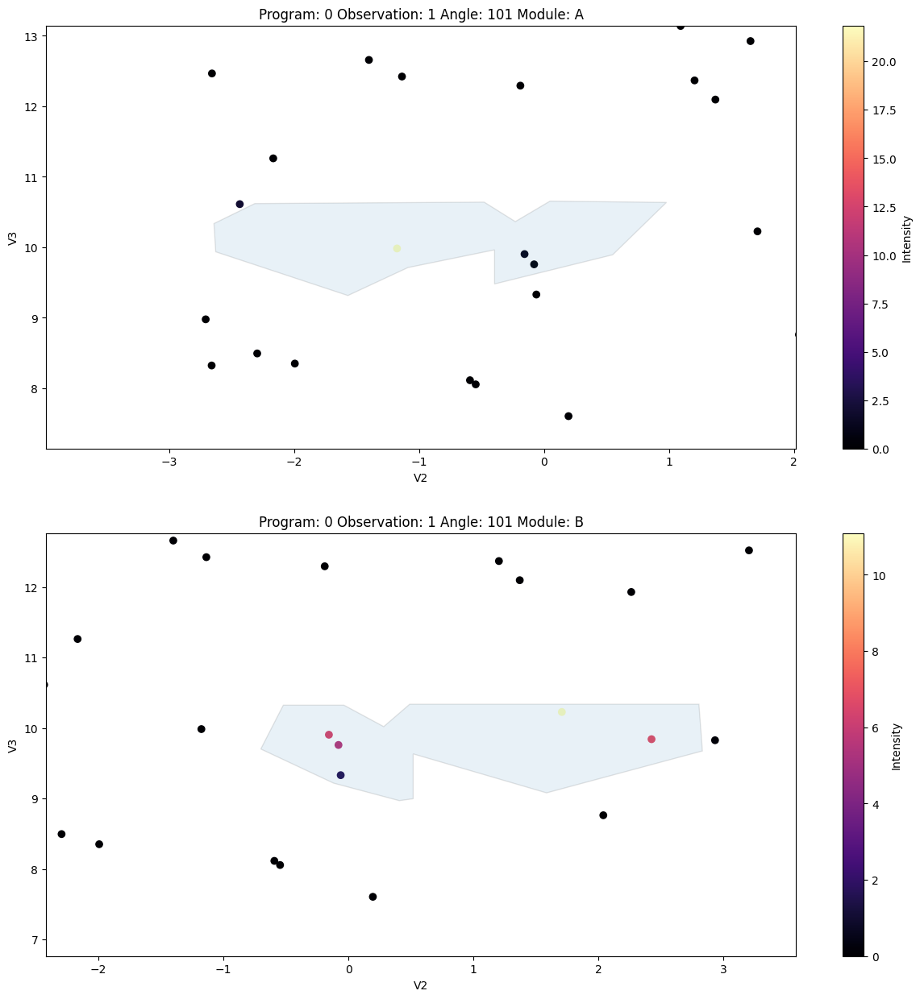

<Figure size 1000x1000 with 0 Axes>

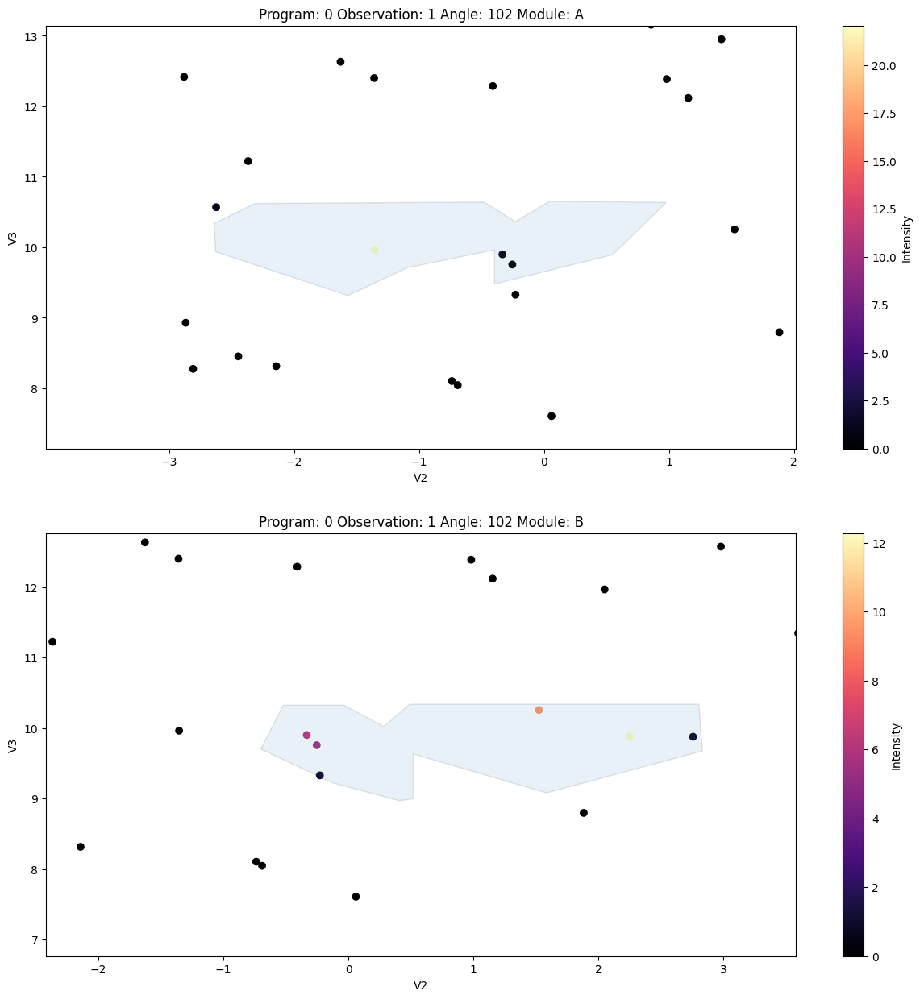

<Figure size 1000x1000 with 0 Axes>

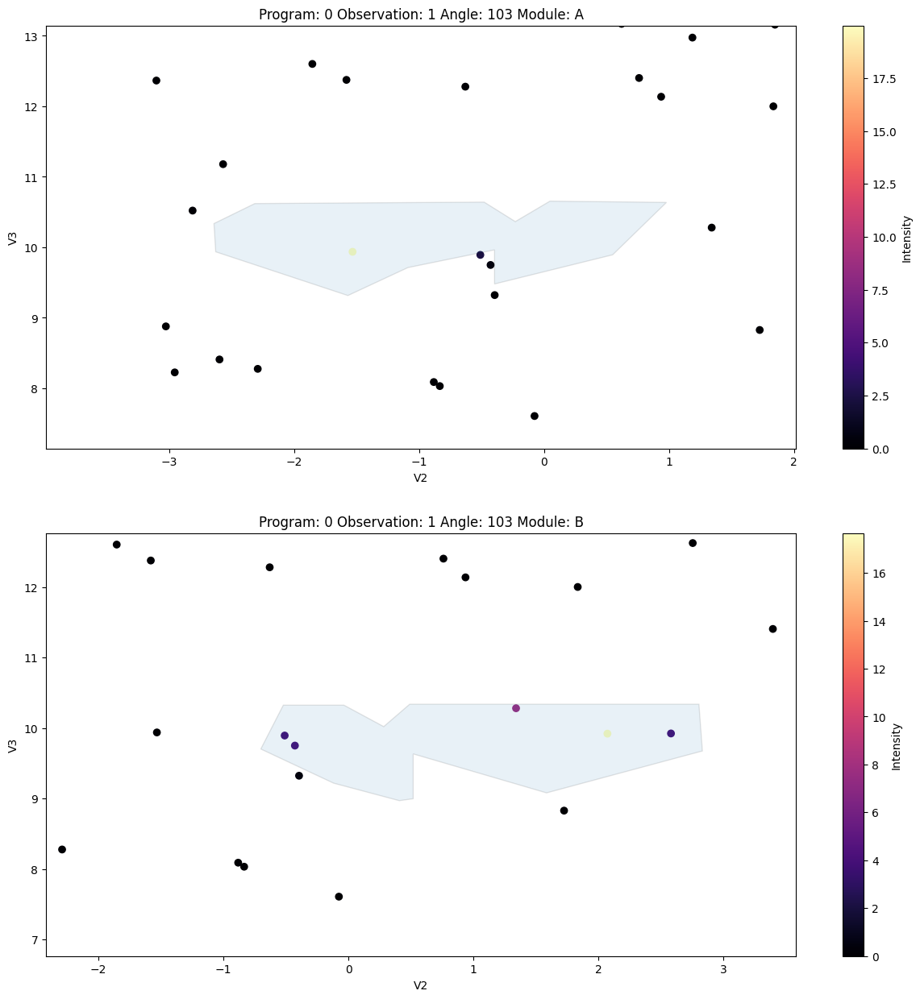

<Figure size 1000x1000 with 0 Axes>

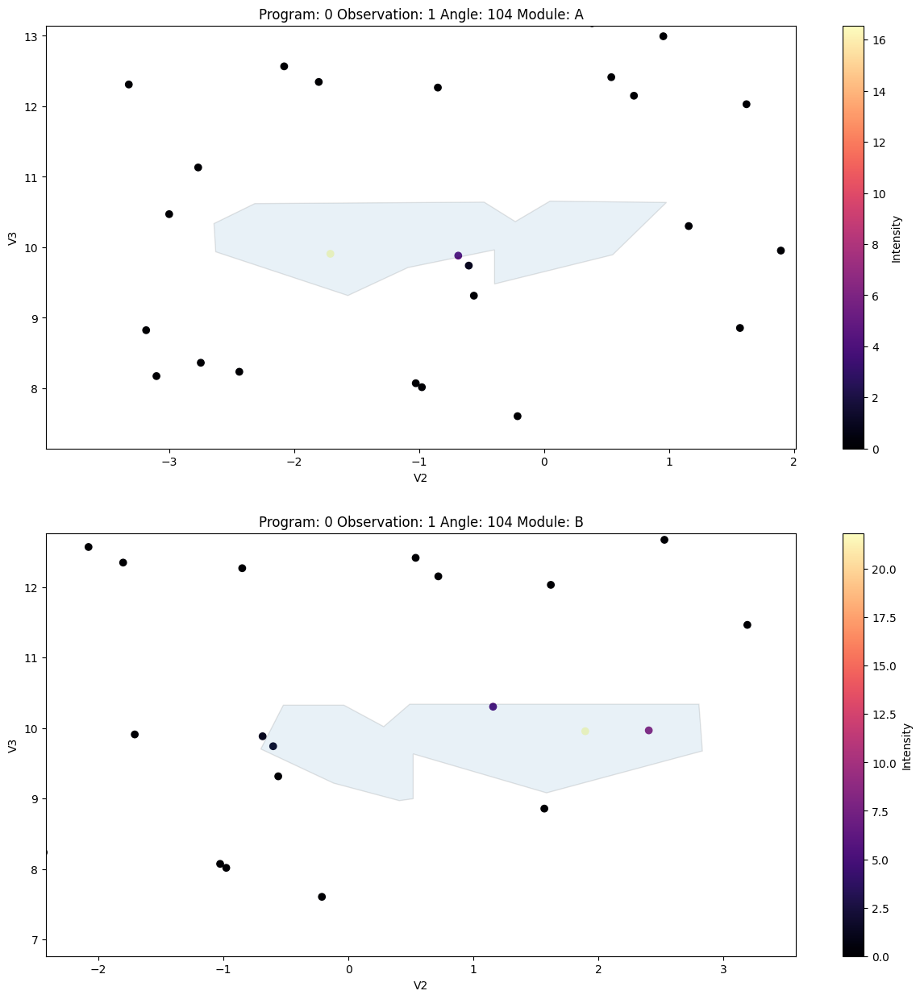

<Figure size 1000x1000 with 0 Axes>

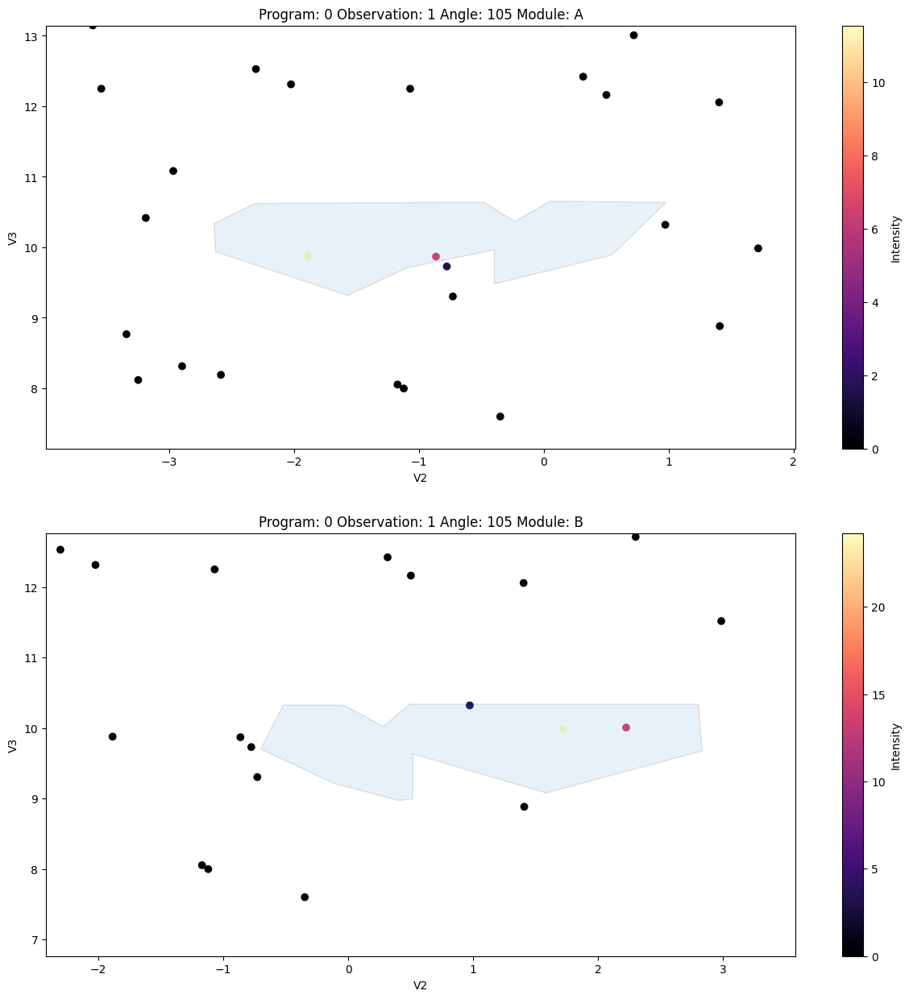

In [14]:
from jwst_rogue_path_tool.plotting import plot_fixed_angle_regions

angles = np.arange(100, 106)

for angle in angles:
    plot_fixed_angle_regions(observation, angle)

### Plotting Flux as a Function of Attitude.

Below we show the calculated flux as a function of attitude angle. This figure also ties in the [JWST Backgrounds Tool](https://github.com/spacetelescope/jwst_backgrounds) to calculate the background of the target JWST is observering described in the APT file. By default, we set the parameters for the backgrounds tool to calculate 10% of the minimum background value. You can set the function and percentage via a dictionary and pass it to the AptProgram class.
~~~
jbt_params = [{"threshold":0.1, function:np.min}, {"threshold":0.2, "function":np.mean}, ..... {"threshold":value, "function":stats_function}]

AptProgram(apt_sql_filename, angular_step=1.0, bkg_params=jbt_params)
~~~

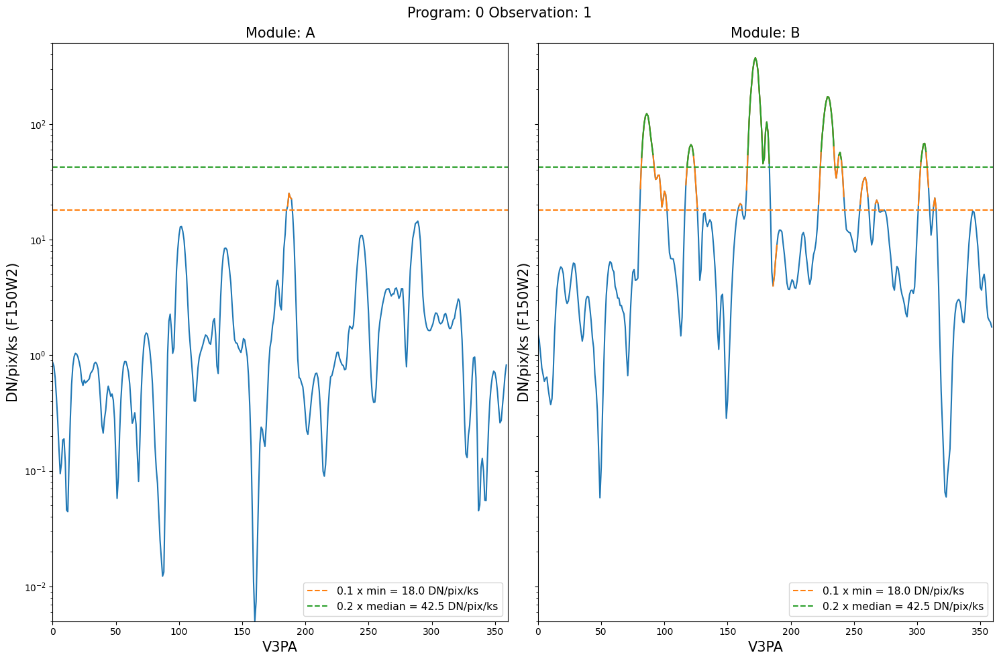

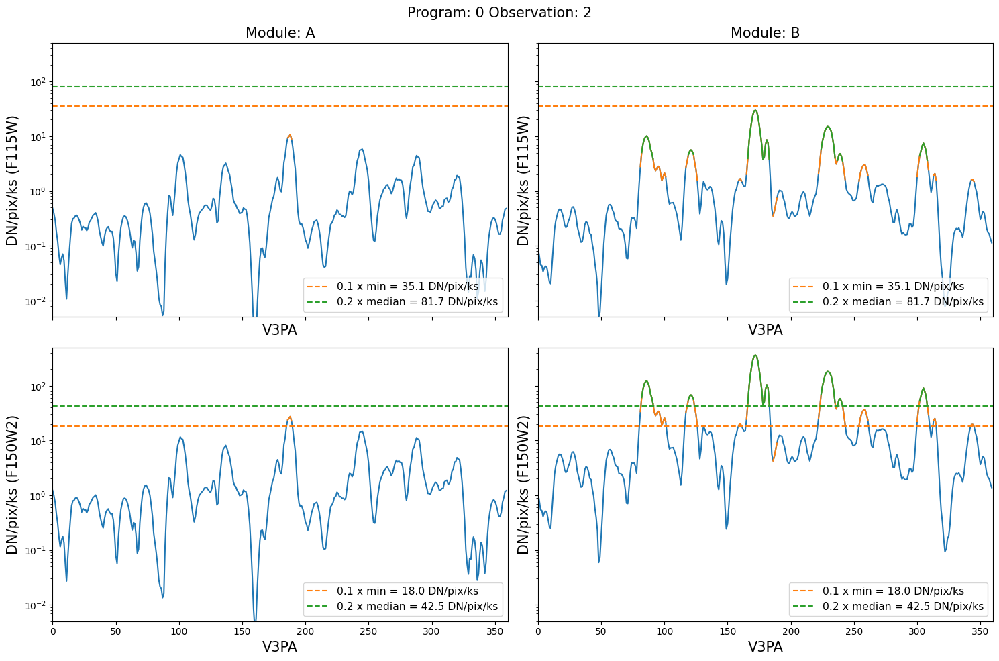

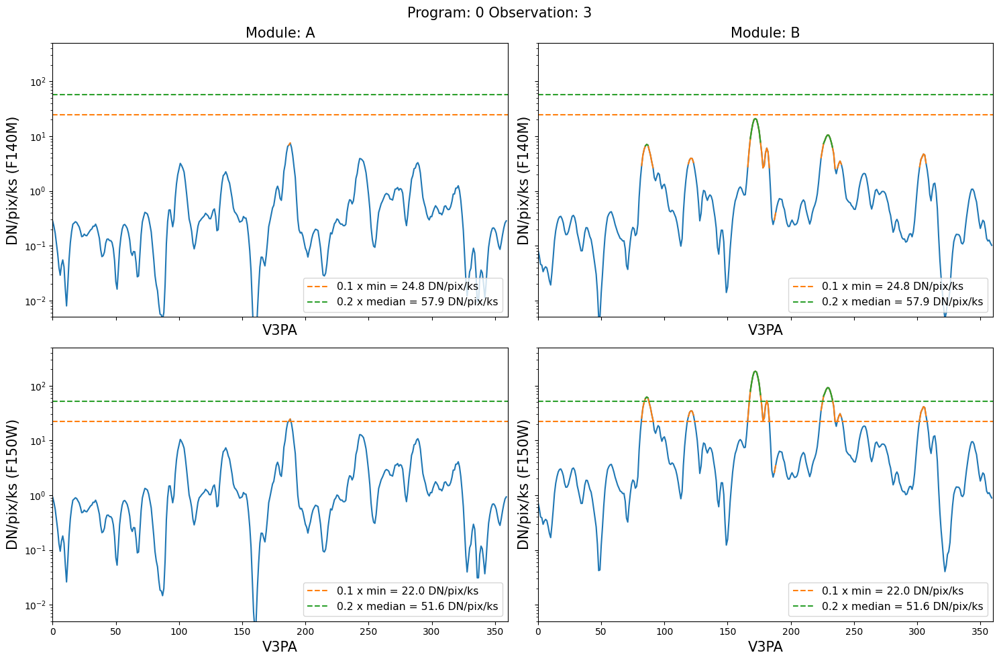

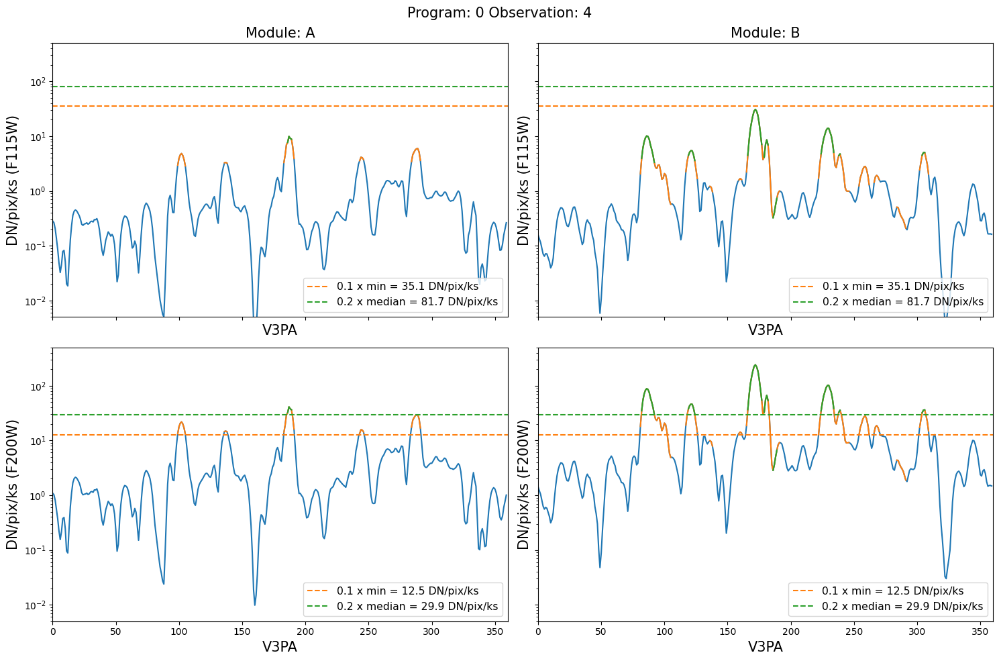

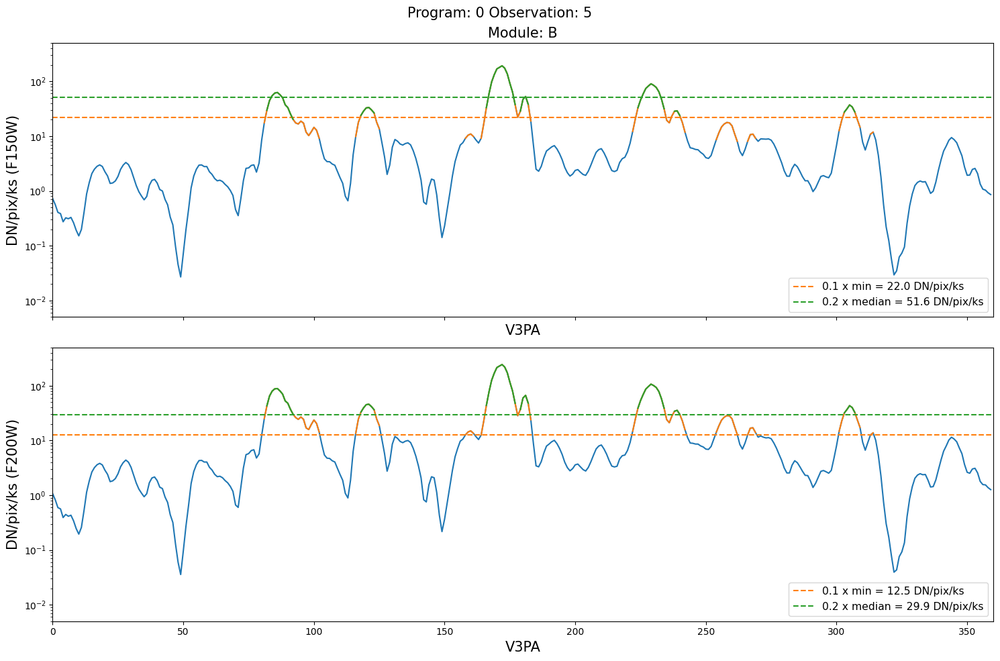

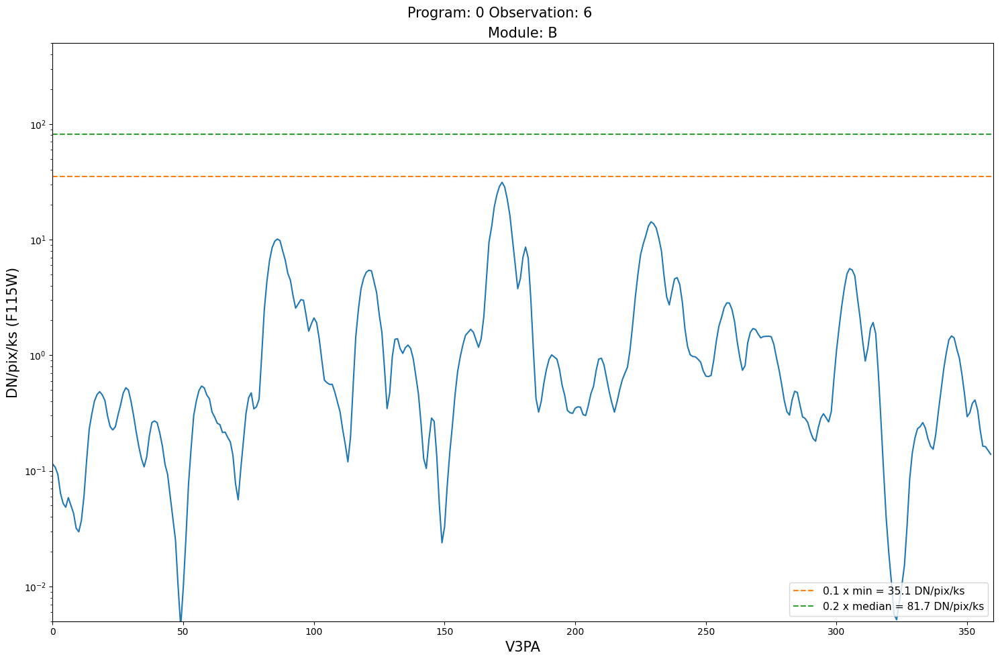

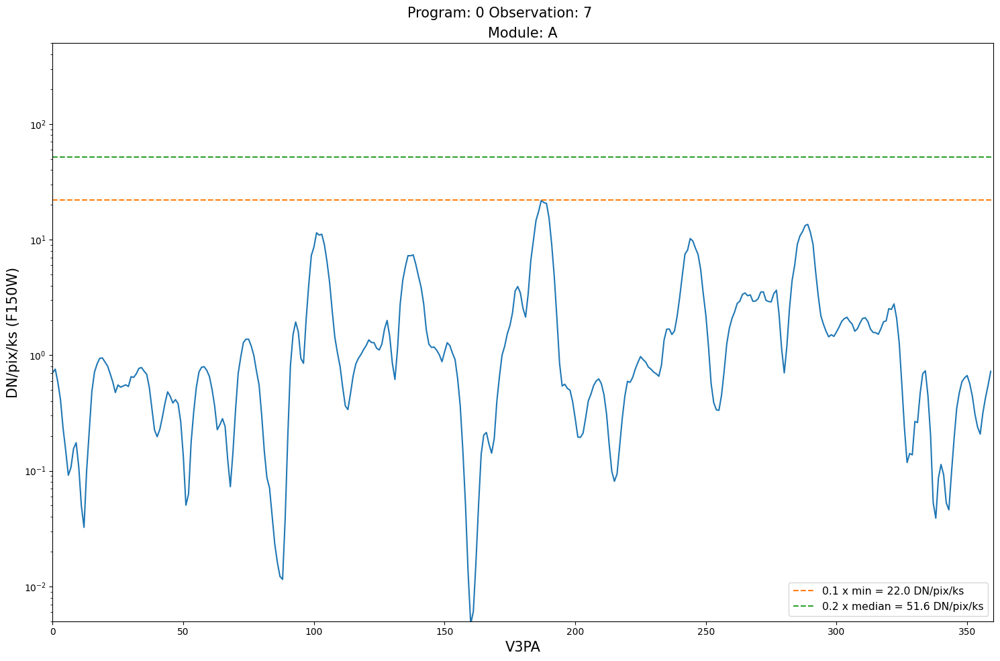

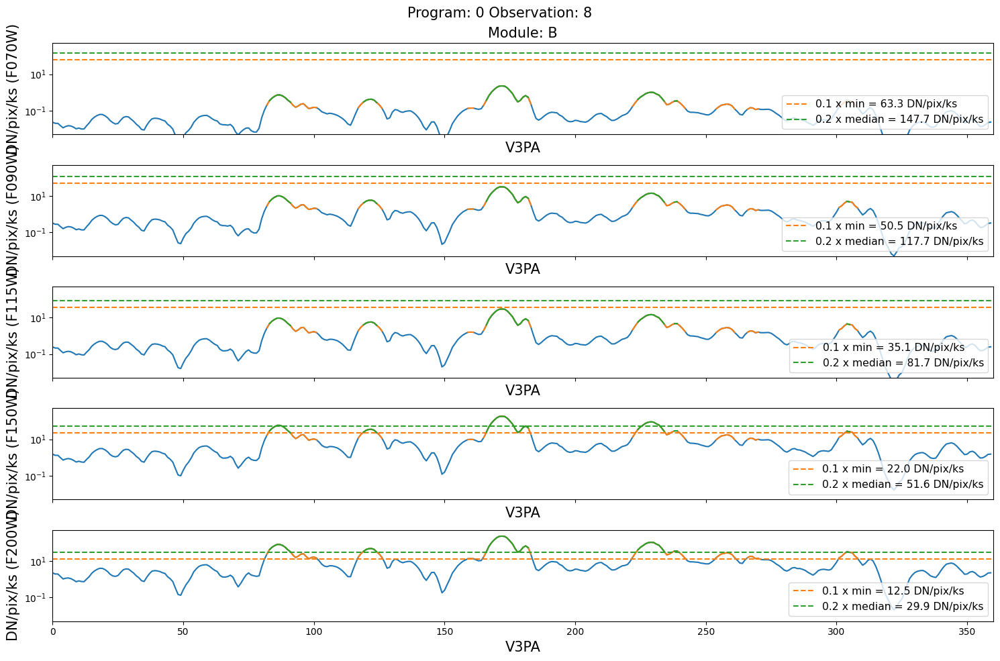

In [15]:
from jwst_rogue_path_tool.plotting import create_v3pa_vs_flux_plot

for obs_number in supported_observations:
    create_v3pa_vs_flux_plot(program.observations.data[obs_number])